# AOS 111 week 2

## Goals
- [ ] Regularization(Ridge) for normal equation
- [ ] Gradient descent (A linear model)
- [ ] Regression with sklearn

Created by Donglai Ma, August 2020


## Ridge regularization for normal equation

### Create a nonlinear data base
We will use the same dataset with last week to check the performance.
We will also use some functions in week1's notebook， this time we fix the random seed```np.random.seed(seed=100)```, so you can compare the result with each other on Thursday.




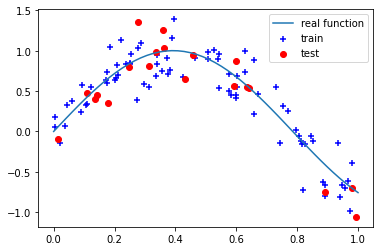

In [1]:
# Prepare the dataset
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Prepare the function of 'fake' dataset
m = 100  # number of total samples

test_size = 0.2  # test dataset ~ 20%
np.random.seed(seed=100)
x = np.random.rand(m)  # get random data(x_0,x_1,..., x_{m-1})

f = np.sin(4 * x)

noise = np.random.normal(0, 0.2, x.shape)  # add some noise

y = f + noise

# Split the dataset
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size)

# Plot the result
p_train = plt.scatter(x_train, y_train, marker='+', c='b', label='train')
p_test = plt.scatter(x_test, y_test, marker='o', c='r', label='test')

x_line = np.linspace(0, 1)
p_real = plt.plot(x_line, np.sin(4 * x_line),
                  label='real function')  # plot the real sin(4x)
plt.legend()
plt.show()

In [2]:
#Some functions last week
##############################
def addpoly(x, n):
    """
    @x: array of training samples
    @n: order of the input  
    @return: array of X 
    """

    x_vec = np.zeros((len(x), n + 1))
    for i in range(n + 1):
        x_vec[:, i] = x**i
    return x_vec


def outexpression(theta):
    """
    @theta: The theta hat,remember the theta is matrix
    #return: output an expression of the theta
    """
    theta_array = np.array(theta).squeeze()

    expression = 'y = '
    for i in range(len(theta_array) - 1, -1, -1):
        expression_new = "{:.2f}" + "*x^" + "{:.0f}"

        expression += expression_new.format(theta_array[i], i)
        if i is not 0:
            expression += '+'
    return expression


##############################

### Solve normal equation(ICC-partA)

The approxiamte ${\theta}$ is 
$$\widehat{\boldsymbol{\theta}}=\left(\mathbf{X}^{T} \mathbf{X}\right)^{-1} \mathbf{X}^{T} \mathbf{Y}$$

We want to normalize the theta, so it won't be that big like what we did in week1

Ridge regularization
$$\widehat{\boldsymbol{\theta}}=\left(\mathbf{X}^{T} \mathbf{X} + \lambda \mathbf{A}\right)^{-1} \mathbf{X}^{T} \mathbf{Y}$$

Change the *solvenormal* function in last week and check the different performance!

y = -1.10*x^1+0.93*x^0
y = -2.00*x^3+-1.42*x^2+2.07*x^1+0.33*x^0
y = 0.14*x^5+-0.77*x^4+-1.47*x^3+-1.24*x^2+1.92*x^1+0.34*x^0
y = 0.76*x^7+0.17*x^6+-0.47*x^5+-1.11*x^4+-1.54*x^3+-1.09*x^2+1.99*x^1+0.32*x^0
y = 0.80*x^9+0.50*x^8+0.13*x^7+-0.28*x^6+-0.74*x^5+-1.18*x^4+-1.44*x^3+-0.93*x^2+1.98*x^1+0.32*x^0
y = 0.69*x^11+0.53*x^10+0.35*x^9+0.13*x^8+-0.14*x^7+-0.45*x^6+-0.79*x^5+-1.14*x^4+-1.32*x^3+-0.83*x^2+1.94*x^1+0.32*x^0
y = 0.54*x^13+0.47*x^12+0.38*x^11+0.27*x^10+0.13*x^9+-0.04*x^8+-0.24*x^7+-0.49*x^6+-0.78*x^5+-1.07*x^4+-1.25*x^3+-0.79*x^2+1.90*x^1+0.32*x^0
y = 0.42*x^15+0.39*x^14+0.35*x^13+0.30*x^12+0.23*x^11+0.14*x^10+0.04*x^9+-0.10*x^8+-0.27*x^7+-0.49*x^6+-0.74*x^5+-1.02*x^4+-1.20*x^3+-0.77*x^2+1.88*x^1+0.32*x^0


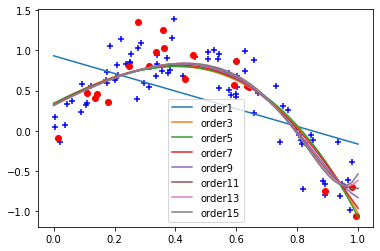

In [3]:
##############################  IN-CLASS CODING: PART A
# Your code starts here


def solvenormal(X, Y, reg='Ridge', lmda=0.1):
    """
    @X : design matrix X
    @Y : design matrix Y
    @reg: regularization method, including 'Ridge'
          and 'None' right now
    @lmda: lambda
    @return: array of theta
    """
    n_1 = X.shape[1]
    if reg is 'Ridge':
        # A = ... create an identity array
        # correctly initialize the identity array elements
        theta = 9999.9999   # solve the normal equation with a regularization term
    elif reg is 'None':
        theta = (X.T @ X).I @ X.T @ Y
    return theta


##############################

Y = y_train.reshape(len(y_train), 1)
x_plot = np.linspace(0, 1)

# Same code with last week
order_max = 16
for i in range(1, order_max + 1, 2):
    phi_vec = addpoly(x_train, i)
    # Use ridge regression
    theta_i = solvenormal(np.matrix(phi_vec), Y,reg = 'Ridge')
    print(outexpression(theta_i))
    x_plot_vec = addpoly(x_plot, i)
    plt.plot(x_plot, x_plot_vec @ theta_i, label='order%d' % i)

p_train = plt.scatter(x_train, y_train, marker='+', c='b')
p_test = plt.scatter(x_test, y_test, marker='o', c='r')
plt.legend()
plt.show()

#### Tips
Writing scalable code means that if a new requirements come to you, in how much of a change, you can adapt to that requirement. The lesser the lines required, the more scalable the code is. 

You could see in this way, you can write different regularization methods in one function instead of a new one.We will also use class in the future which is a more efficient data structure.



## Gradient descent

### Compute the Cost $J(\theta)$ (ICC-partB)

The objective of regression is to minimize the cost function
$$J(\theta)=\frac{1}{2 m} \sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right)^{2}$$

where $h_{\theta}(x)$ is the hypothesis (y_hat in the lecture)and it's given by the linear model:
$$h_{\theta}(\boldsymbol{x}^{(i)})=\theta^{T} \boldsymbol{x}^{(i)}=\theta_{0}x_0^{(i)}+\theta_{1} x_1^{(i)} + ...+\theta_{n} x_n^{(i)}$$

You could also evaluate your model performance on the test dataset with this function $J(\theta)$

**Notice**: You can use for loop to calculate this and it is also important to understand and use vectorization in machine learning, remember last week our input is a set of **m** samples like this:$$  \left[\begin{matrix}
x_0^{(1)}       & x_1^{(1)}    & \cdots & x_n^{(1)}      \\
x_0^{(2)}      & x_1^{(2)}    & \cdots & x_n^{(2)}      \\
 \vdots & \vdots       & \vdots & \vdots         \\
 x_0^{(m)}      & x_1^{(m)}    & \cdots & x_n^{(m)}      \\
\end{matrix}\right] \cdot
\left[\begin{matrix}
\theta_0 \\ \theta_1 \\\vdots \\ \theta_n
\end{matrix}
\right]  = 
\left[\begin{matrix}
h_{\theta}(\boldsymbol{x}^{(1)}) \\ h_{\theta}(\boldsymbol{x}^{(2)}) \\\vdots \\ h_{\theta}(\boldsymbol{x}^{(m)})
\end{matrix}
\right] 
$$

which is $\mathbf{X}\boldsymbol{\theta}= \mathbf{h}$


$\mathbf{y}$ is your target value, so you can write the sum of  error:$\sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right)^{2}$ as $sum((\mathbf{h}-\mathbf{y})^2)$

*Remember you are calculating the sum along 0 axis*, a code example: ```np.sum(your_array,axis = 0)```
*If the result is a,it would return to an array([a]) because your_array is an array with (m,1) shape, so you can use this*:```np.sum(your_array,axis = 0)[0]```






In [4]:
############################## IN-CLASS CODING: PART B
# Your code starts here


def costfunction(X, y, theta):
    """
    @X : Input matrix X
    @y : Output y
    @theta : theta array
    @return: cost value J
    """
    # m = length of the training set
    # y_pred = predicted value
    # error = what is the total error
    return 9999.9999


##############################
# test your costfunction

My_Xtest = np.array([[1,2],[3,4],[5,6]])
My_ytest = np.array([[1],[2],[3]])
My_thetatest = np.array([[0],[1]])
print(costfunction(My_Xtest,My_ytest,My_thetatest)) # The result should be 14/6 :) #


2.333333333333333


### Gradient descent algorithm(ICC-partC)

Minimize the cost function $J(\theta)$ by updating the below equation and repeat until convergence (lecture 2.2)
$$\theta_{j}:=\theta_{j}-\alpha \frac{1}{m} \sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{j}^{(i)}$$ 
Let's see how to write this in code step by step:

Think $\sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{j}^{(i)}$ as $g_j$
,so $\boldsymbol{\theta} : = \boldsymbol{\theta} -\alpha \frac{1}{m} \mathbf{g} $
$$\left[\begin{matrix}
\theta_0 \\ \theta_1 \\\vdots \\\theta_j \\ \vdots \\\theta_n
\end{matrix}
\right] : = \left[\begin{matrix}
\theta_0 \\ \theta_1 \\\vdots \\\theta_j \\ \vdots \\\theta_n
\end{matrix}
\right]  - \alpha \frac{1}{m} \left[\begin{matrix}
g_0 \\ g_1 \\\vdots \\g_j \\ \vdots \\g_n
\end{matrix}
\right] $$

$$\mathbf{g} = \left[\begin{matrix}
\sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{0}^{(i)} \\ \sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{1}^{(i)} \\
\vdots \\\sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{j}^{(i)}\\ \vdots \\\sum_{i=1}^{m}\left(h_{\theta}\left(\boldsymbol{x}^{(i)}\right)-y^{(i)}\right) x_{n}^{(i)}
\end{matrix}
\right] =   \left[\begin{matrix}
x_0^{(1)}       & x_1^{(1)}    & \cdots & x_n^{(1)}      \\
x_0^{(2)}      & x_1^{(2)}    & \cdots & x_n^{(2)}      \\
 \vdots & \vdots       & \vdots & \vdots         \\
 x_0^{(m)}      & x_1^{(m)}    & \cdots & x_n^{(m)}      \\
\end{matrix}\right]^T \left[\begin{matrix}
h_{\theta}(\boldsymbol{x}^{(1)})-y^{(1)}\\ h_{\theta}(\boldsymbol{x}^{(2)}) -y^{(1)}\\\vdots \\ h_{\theta}(\boldsymbol{x}^{(m)}-y^{(m)})
\end{matrix}
\right] $$

so, $\mathbf{g} = X^T \cdot (\mathbf{h}-\mathbf{y})$




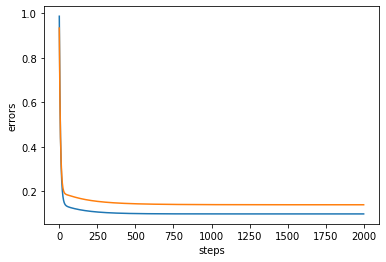

Final function y = -1.11*x^1+0.94*x^0


In [5]:
############################## IN-CLASS CODING: PART C
# Your code starts here
# You won't need np.matrix here


def gradientdescent(X, y, theta, alpha, iterations):
    """
    @X: Input X
    @y: Output y
    @theta: theta array
    @alpha: parameters for gradient descent,learning rate
    @iterations: steps of gradient descent
    
    @return :
        @theta: theta array which would been updated
        @costs: history of costs
        @theta_his: history of theta
    """
    m = len(y)
    costs = []
    theta_his = []  # Store the history theta
    for i in range(iterations):
        ###################
        # y_pred = mode prediction
        
        # g = as defined above

        # theta -= update theta
        
        cost_step = 9999.9999
        ###################
        costs.append(cost_step)
        theta_tuple = (theta[0,0],theta[1,0])
        theta_his.append(theta_tuple)
        

    return theta, costs, theta_his

X_input = (addpoly(x_train, 1))
y_target = y_train.reshape(len(y_train), 1)


# Initiate a theta
theta = np.array([[1.5],[0.5]])
theta, costs, theta_his = gradientdescent(X_input,
                                           y_target,
                                           theta,
                                           alpha=0.05,
                                           iterations=2000)

# Use theta_his to calculate the error on test dataset

tests = []
X_test = (addpoly(x_test, 1))
y_test = y_test.reshape(len(y_test), 1)
for i in range(len(theta_his)):
    theta_i = np.array([[theta_his[i][0]],[theta_his[i][1]]])
    test_error = costfunction(X_test, y_test, theta_i)
    tests.append(test_error)
plt.plot(costs,label='training costs')
plt.plot(tests,label='test costs')
plt.xlabel('steps')
plt.ylabel('errors')
plt.show()
print("Final function", outexpression(theta))


### Gradient descent visualization
Now let's see how gradient descent works during these steps! 

#### Jupyter notebook user
```%matplotlib notebook``` create a backend for you to do zoom-able & resize-able plot, here we use this to do interactive plot. You can drag the interactive bar to check how gradient descent works.

In [6]:
# For jupyter notebook user
%matplotlib notebook
from ipywidgets import *
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(10, 5))
#plot the cost
ax_cost = fig.add_subplot(121)
ax_gradient = fig.add_subplot(122)

# Use this to see more accurate results
#plt.axis('equal')


fig.show()



def update(i=0):
    ax_cost.clear()
    ax_gradient.clear()
    
    # plot the cost of training and test his
    ax_cost.plot(costs[0:i], label='train')
    ax_cost.plot(tests[0:i], label='test')
    ax_cost.set_xlabel('steps')
    ax_cost.set_ylabel('cost')
    ax_cost.legend()

    # Trace of gradient descent, i is the training steps
    # get the history
    theta_0 = np.array([x[0] for x in theta_his[0:i]]).squeeze()
    theta_1 = np.array([x[1] for x in theta_his[0:i]]).squeeze()
    print("Steps:", i)
    print("Costs:", costs[i])
    
    theta_i = [[theta_his[i][0]], [theta_his[i][1]]]
    print("result function", outexpression(theta_i))
    
    ax_gradient.plot(theta_0, theta_1, 'r')

    ax_gradient.set_xlabel('theta_0')
    ax_gradient.set_ylabel('theta_1')

    # Make the background
    grid_num = 50
    xx = ax_gradient.get_xlim()
    yy = ax_gradient.get_ylim()
    x = np.linspace(xx[0], xx[1], num=grid_num)
    y = np.linspace(yy[0], yy[1], num=grid_num)
    XX, YY = np.meshgrid(x, y)
    cost_values = np.zeros((grid_num, grid_num))
    for i in range(grid_num):
        for j in range(grid_num):
            t = np.array([[x[i]], [y[j]]])
            cost_values[i, j] = costfunction(X_input, y_target, t)

    cost_back = ax_gradient.contourf(XX, YY, cost_values.T,levels = 20)
    
    fig.canvas.draw()

    


interact(update, i=(1, 1999))

<IPython.core.display.Javascript object>

interactive(children=(IntSlider(value=1, description='i', max=1999, min=1), Output()), _dom_classes=('widget-i…

<function __main__.update>

<IPython.core.display.Javascript object>

#### Tips
You may wondering why the gradient descent plot doesn't seem to be perpendicular to the contour lines at first. That's because the scales of x-axis and y-axis are not the same, try to uncomment ```plt.axis('equal')``` in the last block and rerun it.


#### Google Colab user

[The notebook backend is not supported in google colab](https://github.com/googlecolab/colabtools/issues/616).
Here I use [plotly](https://plotly.com/) which is a super cool library for plotting, Jupyter users could also install plotly to check it. You can drag it and zoom it!


In [7]:
!pip install plotly
import plotly.graph_objects as go
grid_num = 100
cost_values = np.zeros((grid_num, grid_num))
xx = np.linspace(-0.5, 2, num=grid_num)
yy = np.linspace(-1.5, 1, num=grid_num)
for i in range(grid_num):
    for j in range(grid_num):
        t = np.array([[xx[i]], [yy[j]]])
        cost_values[i, j] = costfunction(X_input, y_target, t)

total_steps = 2000
theta_0 = np.array([x[0] for x in theta_his[0:total_steps]]).squeeze()
theta_1 = np.array([x[1] for x in theta_his[0:total_steps]]).squeeze()


fig = go.Figure(
    data=[
        go.Surface(contours={
            "z": {
                "show": True,
                "start": 0,
                "end": 5,
                "size": 0.05,
                "color": "white"
            }
        },
                   z=cost_values.transpose(),
                   x=xx,
                   y=yy,colorscale='Viridis'),

    ]*3,
    layout=go.Layout(updatemenus=[
        dict(type="buttons",
             buttons=[dict(label="Play", method="animate", args=[None]),
                     dict(label="Stop", method="animate", args=[[None], {"frame": {"duration": 0, "redraw": False},
                                  "mode": "immediate",
                                  "transition": {"duration": 0}}])])
    ]),
    frames=[
        go.Frame(data=[
            go.Scatter3d(x=[theta_0[k]],
                         y=[theta_1[k]],
                         z=[costs[k]],
                         mode="markers+text",
                         marker=dict(color="red",size = 5),
                         text = 'steps ='+str(k),
                         textfont = dict(color="red",size = 10)),
            
            go.Scatter3d(x=[theta_0[m] for m in range(k)],
                         y=[theta_1[m] for m in range(k)],
                         z=[costs[m] for m in range(k)],
                         mode="lines+text",
                         line=dict(color="red",width = 2))
            
            
            
        ]) for k in np.arange(0, total_steps, 10)
    ])
fig.update_layout(title='Gradient descent',
                  scene = dict(
            
                      xaxis_title='theta_0',
                      yaxis_title='theta_1',
                      zaxis_title='Cost value'),
                  autosize=False,
                  width=500,
                  height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

 You could see the speed of descent is very high at the beginning and then gradually decreases.

## Regression with sklearn

You could see although we successfully reproduce the whole procedure of simple ridge regression, it's still time consuming and not easily to use. There are various python package which help us to build the model.

Let's use scikit learn's ridge regression package to do the same thing.
The website is [here](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Ridge.html)

In [8]:
from sklearn.linear_model import Ridge

mymodel = Ridge(alpha=0.01)

mymodel.fit(X_input,y_target)
mymodel.get_params()
print(mymodel.coef_)
print(mymodel.intercept_)


[[ 0.         -1.11416262]]
[0.9404271]


You could notice there is a 0 in the coef, it's because when we made X_input, we add  column $ 1 (x^0)$ in the input.
In the scikit learn linear model
$$\hat{y}(w, x)=w_{0}+w_{1} x_{1}+\ldots+w_{p} x_{p}$$
 Across the module, they designate the vector $w=\left(w_{1}, \ldots, w_{p}\right)$ as coef_ and $w_{0}$ as intercept_.
The result would be very close to your own gradient result.

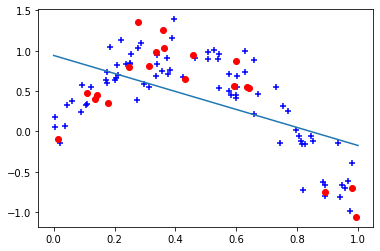

In [9]:
%matplotlib inline
x_plot = np.linspace(0, 1)
y_predict = mymodel.predict(addpoly(x_plot,1))
predict = plt.plot(x_line,y_predict)
p_train = plt.scatter(x_train, y_train, marker='+', c='b')
p_test = plt.scatter(x_test, y_test, marker='o', c='r')
plt.show()